<div style="text-align: center; background: linear-gradient(to right, #FFA500, #FF4500); padding: 30px; border-radius: 15px; box-shadow: 0 4px 12px rgba(0,0,0,0.2);">
  <h1 style="color: white; font-weight: 800; font-size: 32px; margin-bottom: 10px;">
    Evaluating <span style="color: #ffe4b5;">NuExtract 2.0-8B</span> for Structured Data Extraction from Images
  </h1>
  <p style="color: #ffe4b5; font-size: 18px; margin: 0;">
    A Practical Assessment of Multimodal Information Extraction from Visual Data
  </p>
</div>

In this notebook, we will evaluate the performance of <a href="https://huggingface.co/numind/NuExtract-2.0-8B" target="_blank" style="color: #FFA500; font-weight: bold;">NuExtract 2.0-8B</a> on a variety of structured data extraction tasks from images. By testing the model on different cases, we aim to assess its ability to accurately extract structured information from diverse visual data. Throughout this assessment, we will explore its strengths and limitations across multiple document layouts and image types, providing a comprehensive overview of its performance.

# **1. Install Libraries**

In [1]:
%%capture
! pip install qwen-vl-utils
! pip install rich

# **2. Import Libraries**

In [2]:
import torch
from transformers import AutoProcessor, AutoModelForVision2Seq
from qwen_vl_utils import process_vision_info, fetch_image
import json
from rich import print
from rich.console import Console
from rich.syntax import Syntax
from PIL import Image
from IPython.display import display

# **3. Load numind/NuExtract-2.0-8B**

In [3]:
model_name = "numind/NuExtract-2.0-8B"
# model_name = "numind/NuExtract-2.0-8B"

model = AutoModelForVision2Seq.from_pretrained(model_name, 
                                               trust_remote_code=True, 
                                               torch_dtype=torch.bfloat16,
                                               #attn_implementation="flash_attention_2",
                                               device_map="auto")
processor = AutoProcessor.from_pretrained(model_name, 
                                          trust_remote_code=True, 
                                          padding_side='left',
                                          use_fast=True)

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

You have video processor config saved in `preprocessor.json` file which is deprecated. Video processor configs should be saved in their own `video_preprocessor.json` file. You can rename the file or load and save the processor back which renames it automatically. Loading from `preprocessor.json` will be removed in v5.0.


# **Inference**

In [4]:
# Helper function to extract images from examples
def extract_example_images(example_item):
    if not example_item:
        return []
        
    # Handle both list of examples and single example
    examples_to_process = example_item if isinstance(example_item, list) else [example_item]
    images = []
    
    for example in examples_to_process:
        if isinstance(example.get('input'), dict) and example['input'].get('type') == 'image':
            images.append(fetch_image(example['input']))
            
    return images

In [5]:
def process_all_vision_info(messages, examples=None):
    """
    Process vision information from both messages and in-context examples, supporting batch processing.
    
    Args:
        messages: List of message dictionaries (single input) OR list of message lists (batch input)
        examples: Optional list of example dictionaries (single input) OR list of example lists (batch)
    
    Returns:
        A flat list of all images in the correct order:
        - For single input: example images followed by message images
        - For batch input: interleaved as (item1 examples, item1 input, item2 examples, item2 input, etc.)
        - Returns None if no images were found
    """
    
    # Normalize inputs to always be batched format
    is_batch = messages and isinstance(messages[0], list)
    messages_batch = messages if is_batch else [messages]
    is_batch_examples = examples and isinstance(examples, list) and (isinstance(examples[0], list) or examples[0] is None)
    examples_batch = examples if is_batch_examples else ([examples] if examples is not None else None)
    
    # Ensure examples batch matches messages batch if provided
    if examples and len(examples_batch) != len(messages_batch):
        if not is_batch and len(examples_batch) == 1:
            # Single example set for a single input is fine
            pass
        else:
            raise ValueError("Examples batch length must match messages batch length")
    
    # Process all inputs, maintaining correct order
    all_images = []
    for i, message_group in enumerate(messages_batch):
        # Get example images for this input
        if examples and i < len(examples_batch):
            input_example_images = extract_example_images(examples_batch[i])
            all_images.extend(input_example_images)
        
        # Get message images for this input
        input_message_images = process_vision_info(message_group)[0] or []
        all_images.extend(input_message_images)
    
    return all_images if all_images else None

In [6]:
def display_extracted_data(image_path, extracted_aata):
    console = Console()
    # diplay image
    img = Image.open(image_path)
    display(img)

    data_parsed = json.loads(extracted_aata[0])
    # Convert the dictionary to a JSON-formatted string
    data_str = json.dumps(data_parsed, indent=4)

    # Create a syntax object to handle syntax highlighting
    syntax = Syntax(data_str, "json", theme="monokai", line_numbers=False)

    # Display the JSON with keys colored in red
    console.print(syntax)

In [7]:
def extract_data(image_path, data_template):
    document = {"type": "image", "image": image_path}

    messages = [{"role": "user", "content": [document]}]
    text = processor.tokenizer.apply_chat_template(
        messages,
        template=data_template,
        tokenize=False,
        add_generation_prompt=True,
    )

    image_inputs = process_all_vision_info(messages)
    inputs = processor(
        text=[text],
        images=image_inputs,
        padding=True,
        return_tensors="pt",
    ).to("cuda")

    generation_config = {"do_sample": False, "num_beams": 1, "max_new_tokens": 2048}

    # Inference: Generation of the output
    generated_ids = model.generate(
        **inputs,
        **generation_config
    )
    generated_ids_trimmed = [
        out_ids[len(in_ids) :] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
    ]
    output_text = processor.batch_decode(
        generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
    )
    
    display_extracted_data(image_path, output_text) 

## **Example n°1**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


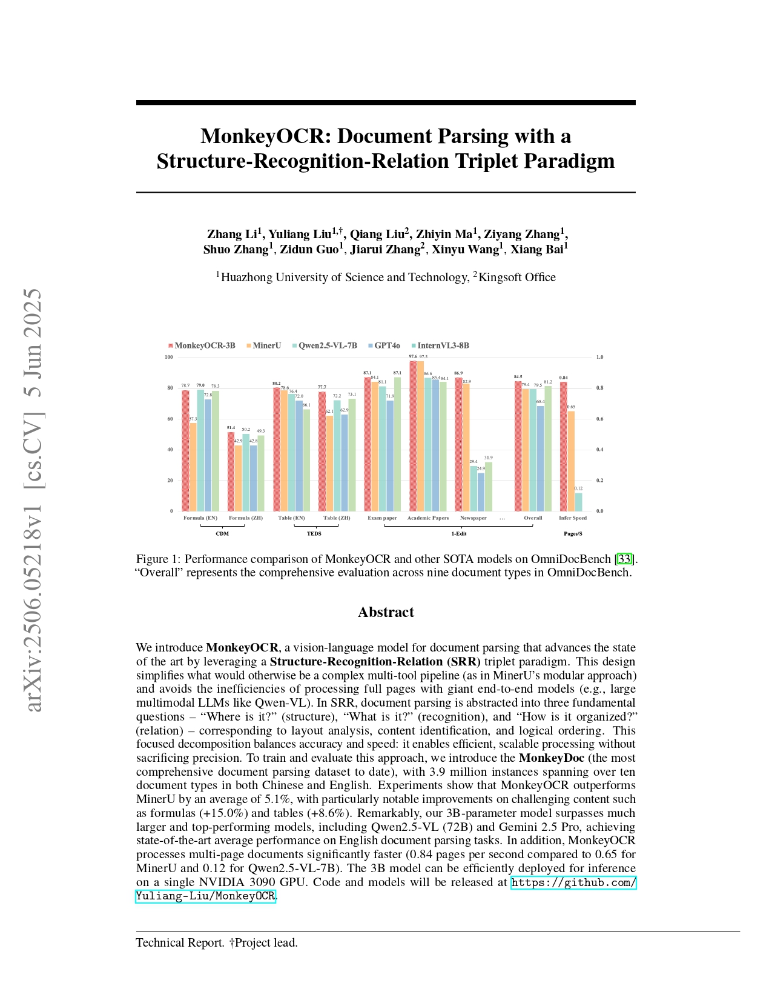

{                                                                                                                  
    "paper_title": "MonkeyOCR: Document Parsing with a Structure-Recognition-Relation Triplet Paradigm",           
    "authors": "Zhang Li, Yuliang Liu, Qiang Liu, Zhiyin Ma, Ziyang Zhang, Shuo Zhang, Zidun Guo, Jiarui Zhang, Xin
    "university": "Huazhong University of Science and Technology, Kingsoft Office",                                
    "publication_date": "2025-06-05",                                                                              
    "code_url": "https://github.com/Yuliang-Liu/MonkeyOCR"                                                         
}                                                                                                                  

In [8]:
template = """{
    "paper_title": "verbatim-string",
    "authors": "string",
    "university": "string",
    "publication_date": "date-time",
    "code_url": "string"
}"""

extract_data(
    "research_papers_pages/2506.05218v1_page-0001.jpg",
    template
)

## **Example n°2**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


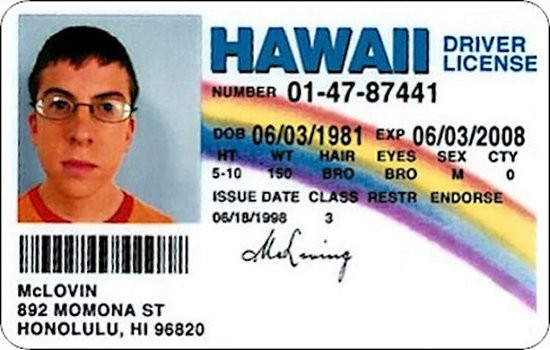

{                                                                                                                  
    "state": "HAWAII",                                                                                             
    "number": "01-47-87441",                                                                                       
    "issue_date": "1998-06-18",                                                                                    
    "location": "HONOLULU, HI 96820",                                                                              
    "class": 3,                                                                                                    
    "expiration_date": "2008-06-03"                                                                                
}                                                                                                                  

In [ ]:
template = """{
    "state": "verbatim-string",
    "number": "string",
    "issue_date": "date-time",
    "location": "verbatim-string",
    "class": "integer",
    "expiration_date": "date-time"
}"""

extract_data(
    "fake_identity/id_driver_license.jpg",
    template
)

## **Example n°3**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


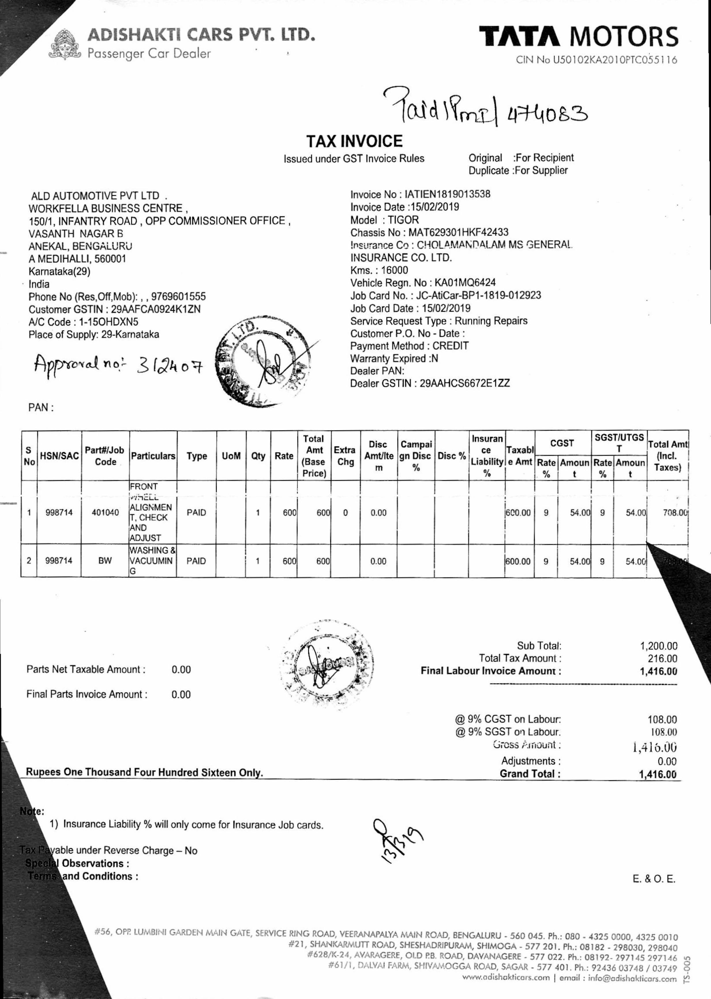

{                                                                                                                  
    "company": "ALD AUTOMOTIVE PVT LTD",                                                                           
    "country": "India",                                                                                            
    "invoice_date": "2019-02-15",                                                                                  
    "model": "TIGOR",                                                                                              
    "job_card_date": "2019-02-15",                                                                                 
    "grand_total": 1416.0,                                                                                         
    "payment_method": "CREDIT",                                                                                    
    "email": "info@adishakticars.com"                                                                              
}                                                                                                                  

In [10]:
template = """{
    "company": "string",
    "country": "string",
    "invoice_date": "date-time",
    "model": "string",
    "job_card_date: "date-time",
    "grand_total": "number",
    "payment_method": "string",
    "email": "string"
}"""

extract_data(
    "invoice_data/PMI-474083-1-images-0.jpg",
    template
)

## **Example n°4**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


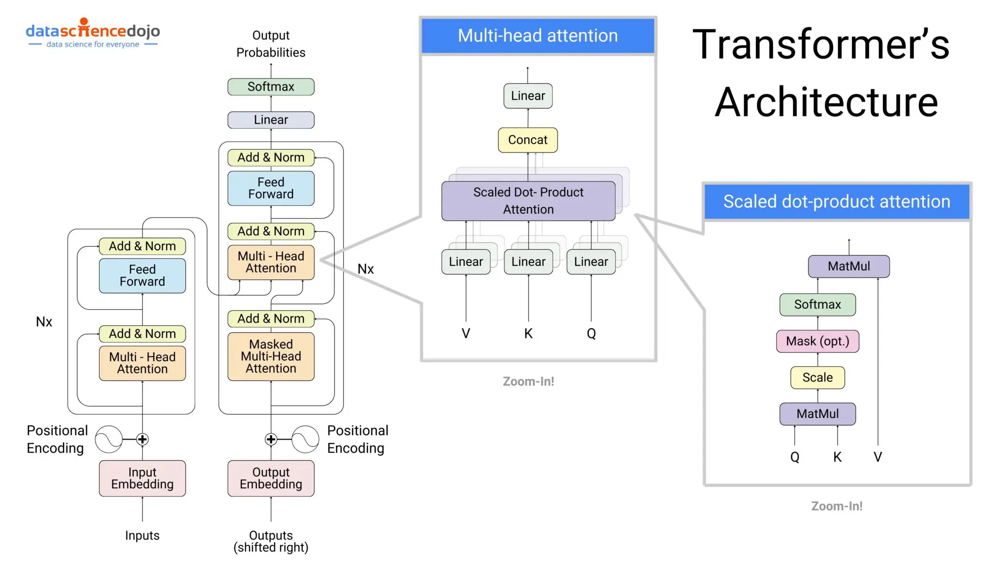

{                                                                                                                  
    "architecture_title": "Transformer's Architecture",                                                            
    "multihead_attention_layers": [                                                                                
        "Multi-Head Attention",                                                                                    
        "Masked Multi-Head Attention"                                                                              
    ],                                                                                                             
    "scaled_dot_product_attention_layers": [                                                                       
        "Scaled Dot-Product Attention"                                                                             
    ],                                                                                                             
    "encoder_layers": [                                                                                            
        "Add & Norm",                                                                                              
        "Feed Forward",                                                                                            
        "Multi-Head Attention"                                                                                     
    ],                                                                                                             
    "decoder_layers": [                                                                                            
        "Add & Norm",                                                                                              
        "Feed Forward",                                                                                            
        "Multi-Head Attention"                                                                                     
    ]                                                                                                              
}                                                                                                                  

In [ ]:
template = """{
    "architecture_title": "string",
    "multihead_attention_layers": ["string"],
    "scaled_dot_product_attention_layers": ["string"],
    "encoder_layers": ["string"],
    "decoder_layers": ["string"],

}"""

extract_data(
    "research_papers_pages/Architecture-of-transformer-models-2048x1152.jpg.png",
    template
)

## **Example n°5**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


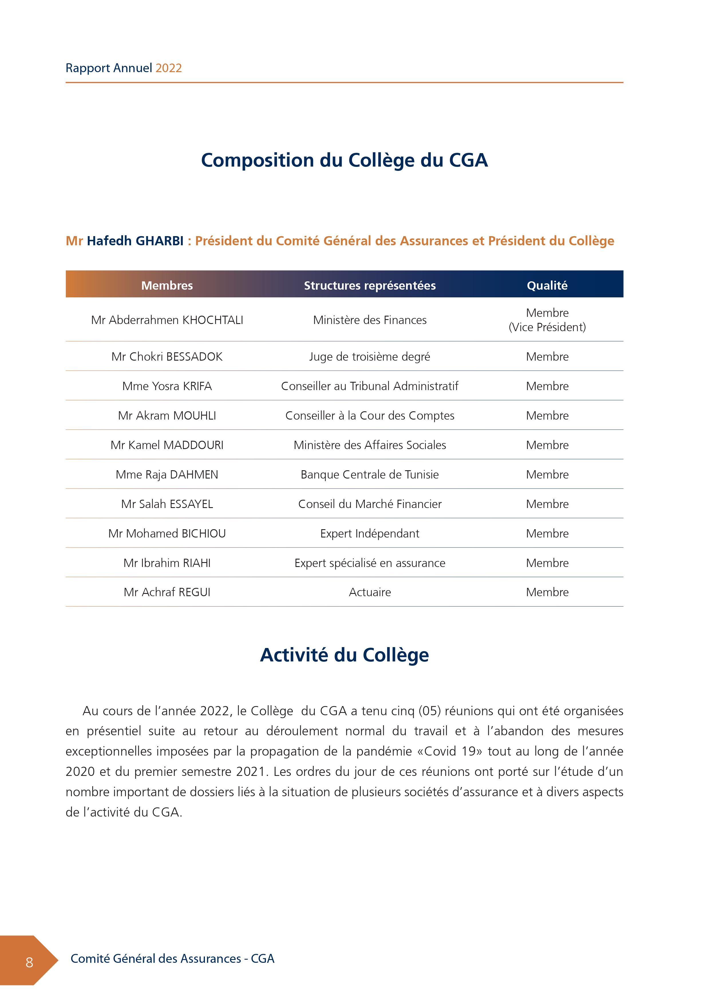

{                                                                                                                  
    "president": "Mr Hafedh GHARBI",                                                                               
    "members": [                                                                                                   
        "Mr Abderrahmen KHOCHTALI",                                                                                
        "Mr Chokri BESSADOK",                                                                                      
        "Mme Yosra KRIFA",                                                                                         
        "Mr Akram MOUHLI",                                                                                         
        "Mr Kamel MADDOURI",                                                                                       
        "Mme Raja DAHMEN",                                                                                         
        "Mr Salah ESSAYEL",                                                                                        
        "Mr Mohamed BICHIOU",                                                                                      
        "Mr Ibrahim RIAHI",                                                                                        
        "Mr Achraf REGUI"                                                                                          
    ],                                                                                                             
    "quality": [                                                                                                   
        "Membre (Vice Pr\u00e9sident)",                                                                            
        "Membre"                                                                                                   
    ]                                                                                                              
}                                                                                                                  

In [12]:
template = """{
    "president": "string",
    "members": ["string"],
    "quality": ["string"]

}"""

extract_data(
    "cga_images/RAP_CGA_FR_ANG_2022-images-8.jpg",
    template
)

## **Example n°6**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


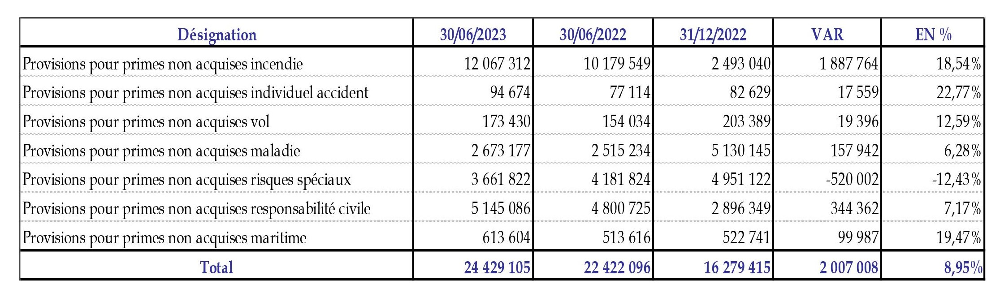

{                                                                                                                  
    "table": {                                                                                                     
        "header": [                                                                                                
            "D\u00e9signation",                                                                                    
            "30/06/2023",                                                                                          
            "30/06/2022",                                                                                          
            "31/12/2022",                                                                                          
            "VAR",                                                                                                 
            "EN %"                                                                                                 
        ],                                                                                                         
        "rows": [                                                                                                  
            {                                                                                                      
                "columns": [                                                                                       
                    {                                                                                              
                        "column": "Provisions pour primes non acquises incendie",                                  
                        "value": "12 067 312"                                                                      
                    },                                                                                             
                    {                                                                                              
                        "column": "Provisions pour primes non acquises individuel accident",                       
                        "value": "94 674"                                                                          
                    },                                                                                             
                    {                                                                                              
                        "column": "Provisions pour primes non acquises vol",                                       
                        "value": "173 430"                                                                         
                    },                                                                                             
                    {                                                                                              
                        "column": "Provisions pour primes non acquises maladie",                                   
                        "value": "2 673 177"                                                                       
                    },                                                                                             
                    {                                                                                              
                        "column": "Provisions pour primes non acquises risques sp\u00e9ciaux",                     
                        "value": "3 661 822"                                                                       
                    },                                                                                             
                    {                                                                                              
                        "column": "Provisions pour prime

In [13]:
template = """{
    "table": {
        "header": [
            "string"
        ],
        "rows": [
            {
                "columns": [
                    {
                        "column": "string",
                        "value": "string"
                    }
                ]
            }
        ]
    }
}"""

extract_data(
    "tables_and_plots_for_testing/cmf_table.jpg",
    template
)

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


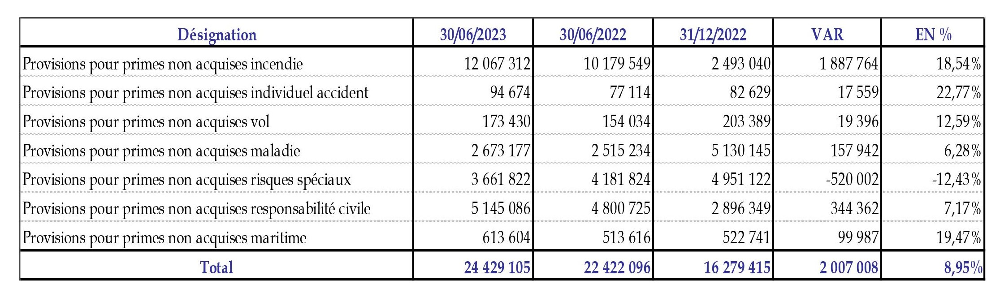

{                                                                                                                  
    "designation": [                                                                                               
        "Provisions pour primes non acquises incendie",                                                            
        "Provisions pour primes non acquises individuel accident",                                                 
        "Provisions pour primes non acquises vol",                                                                 
        "Provisions pour primes non acquises maladie",                                                             
        "Provisions pour primes non acquises risques sp\u00e9ciaux",                                               
        "Provisions pour primes non acquises responsabilit\u00e9 civile",                                          
        "Provisions pour primes non acquises maritime"                                                             
    ],                                                                                                             
    "var": [                                                                                                       
        1887764,                                                                                                   
        17559,                                                                                                     
        19396,                                                                                                     
        157942,                                                                                                    
        -520002,                                                                                                   
        344362,                                                                                                    
        99987                                                                                                      
    ],                                                                                                             
    "en%": [                                                                                                       
        18.54,                                                                                                     
        22.77,                                                                                                     
        12.59,                                                                                                     
        6.28,                                                                                                      
        -12.43,                                                                                                    
        7.17,                                                                                                      
        19.47                                                                                                      
    ]                                                                                                              
}                                                                                                                  

In [14]:
template = """{
    "designation": ["string"],
    "var": ["number"],
    "en%": ["number"],
}"""

extract_data(
    "tables_and_plots_for_testing/cmf_table.jpg",
    template
)

## **Example n°7**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


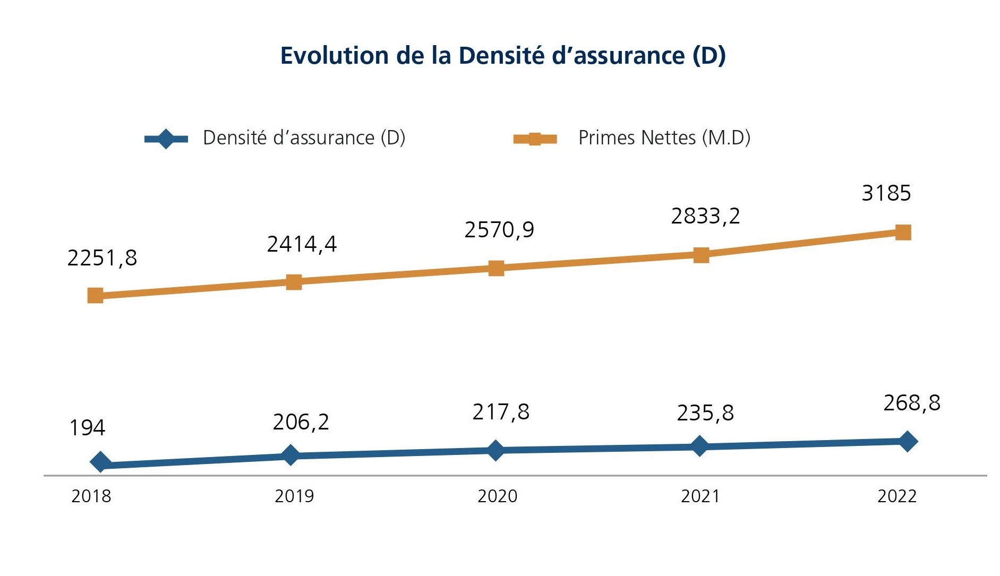

{                                                                                                                  
    "figure": {                                                                                                    
        "title": "Evolution de la Densit\u00e9 d'assurance (D)",                                                   
        "year": 2018,                                                                                              
        "insurance_density": [                                                                                     
            194                                                                                                    
        ],                                                                                                         
        "net_premiums": [                                                                                          
            2251.8                                                                                                 
        ]                                                                                                          
    }                                                                                                              
}                                                                                                                  

In [15]:
template = """{
    "figure": {
        "title": "string",
        "year": "integer",
        "insurance_density": ["number"],
        "net_premiums": ["number"]
    }
}"""

extract_data(
    "tables_and_plots_for_testing/line_plot_cga.jpg",
    template
)

## **Example n°8**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


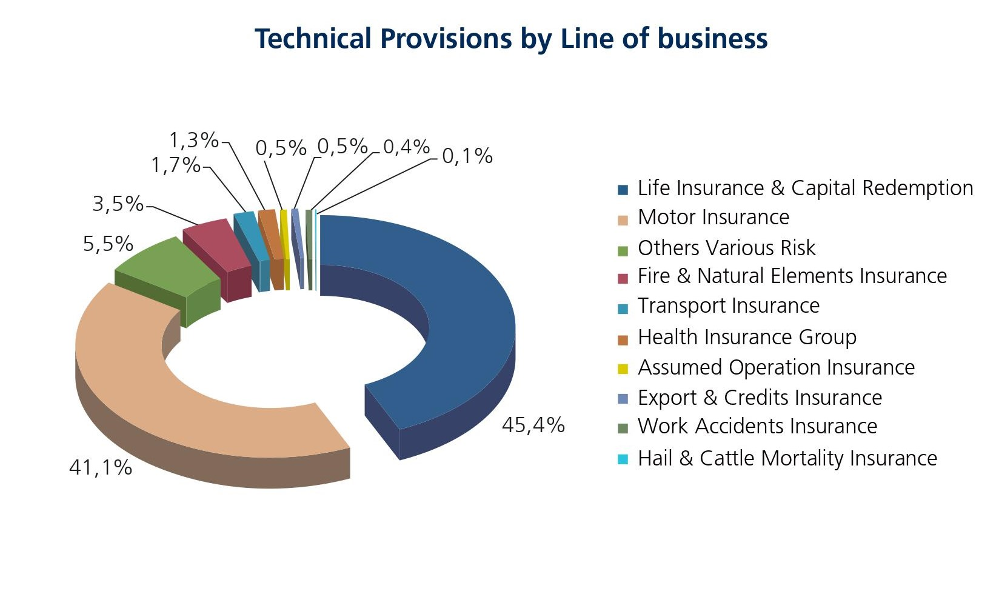

{                                                                                                                  
    "figure": {                                                                                                    
        "title": "Technical Provisions by Line of business",                                                       
        "businesses": [                                                                                            
            "Life Insurance & Capital Redemption",                                                                 
            "Motor Insurance",                                                                                     
            "Others Various Risk",                                                                                 
            "Fire & Natural Elements Insurance",                                                                   
            "Transport Insurance",                                                                                 
            "Health Insurance Group",                                                                              
            "Assumed Operation Insurance",                                                                         
            "Export & Credits Insurance",                                                                          
            "Work Accidents Insurance",                                                                            
            "Hail & Cattle Mortality Insurance"                                                                    
        ],                                                                                                         
        "contribution_percentage": [                                                                               
            45.4,                                                                                                  
            41.1,                                                                                                  
            5.5,                                                                                                   
            3.5,                                                                                                   
            1.7,                                                                                                   
            1.3,                                                                                                   
            0.5,                                                                                                   
            0.4,                                                                                                   
            0.1                                                                                                    
        ]                                                                                                          
    }                                                                                                              
}                                                                                                                  

In [16]:
template = """{
    "figure": {
        "title": "string",
        "businesses": ["string"],
        "contribution_percentage": ["number"]
    }
}"""

extract_data(
    "tables_and_plots_for_testing/donut_plot.jpg",
    template
)

## **Example n°9**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


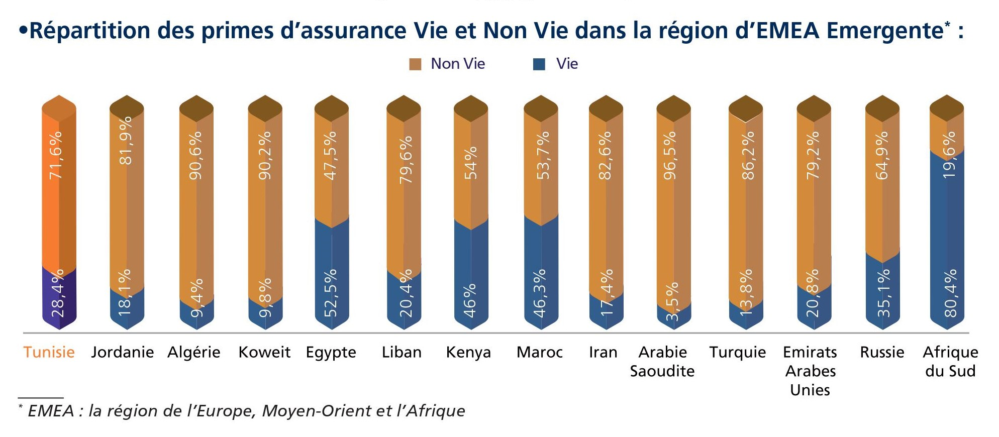

{                                                                                                                  
    "figure": {                                                                                                    
        "title": "R\u00e9partition des primes d\u2019assurance Vie et Non Vie dans la r\u00e9gion d\u2019EMEA Emerg
        "countries": [                                                                                             
            "Tunisie",                                                                                             
            "Jordanie",                                                                                            
            "Alg\u00e9rie",                                                                                        
            "Koweit",                                                                                              
            "Egypte",                                                                                              
            "Liban",                                                                                               
            "Kenya",                                                                                               
            "Maroc",                                                                                               
            "Iran",                                                                                                
            "Arabie Saoudite",                                                                                     
            "Turquie",                                                                                             
            "Emirats Arabes Unies",                                                                                
            "Russie",                                                                                              
            "Afrique du Sud"                                                                                       
        ],                                                                                                         
        "life_contribution": [                                                                                     
            28.4,                                                                                                  
            18.1,                                                                                                  
            9.4,                                                                                                   
            9.8,                                                                                                   
            52.5,                                                                                                  
            20.4,                                                                                                  
            46.3,                                                                                                  
            17.4,                                                                                                  
            3.5,                                                                                                   
            13.8,                                                                                                  
            20.8,                                                                                                  
            35.1,                                                                                                  
            80.4                                                                                                   
        ],                                                                                                         
        "non_life_contribution": [                      

In [17]:
template = """{
    "figure": {
        "title": "string",
        "countries": ["string"],
        "life_contribution": ["number"],
        "non_life_contribution": ["number"]
    }
}"""

extract_data(
    "tables_and_plots_for_testing/cga_2022_bar_plot_2.jpg",
    template
)

## **Example n°10**

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


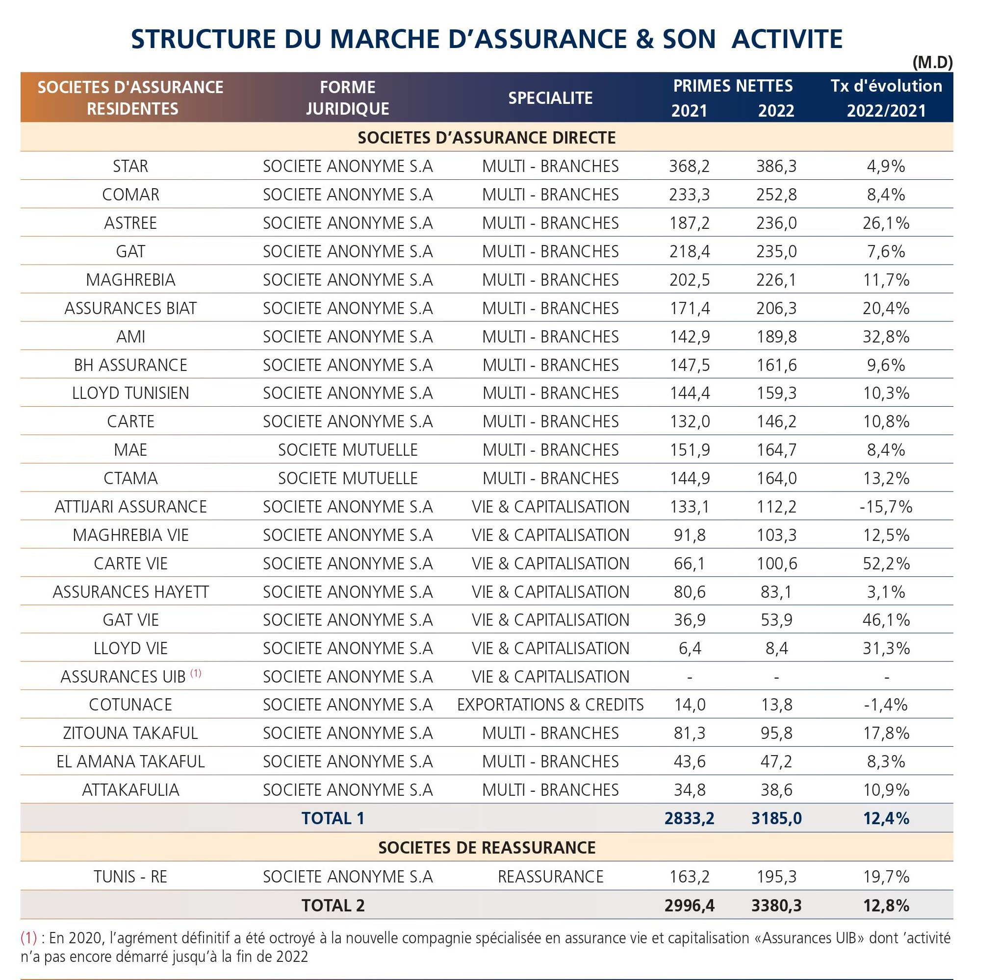

{                                                                                                                  
    "table": {                                                                                                     
        "header": [                                                                                                
            "SOCIETES D'ASSURANCE RESIDENTES",                                                                     
            "FORME JURIDIQUE",                                                                                     
            "SPECIALITE",                                                                                          
            "PRIMES NETTES 2021",                                                                                  
            "PRIMES NETTES 2022",                                                                                  
            "Tx d'\u00e9volution 2022/2021"                                                                        
        ],                                                                                                         
        "rows": [                                                                                                  
            {                                                                                                      
                "column": "STAR",                                                                                  
                "value": "SOCIETE ANONYME S.A"                                                                     
            },                                                                                                     
            {                                                                                                      
                "column": "COMAR",                                                                                 
                "value": "SOCIETE ANONYME S.A"                                                                     
            },                                                                                                     
            {                                                                                                      
                "column": "ASTREE",                                                                                
                "value": "SOCIETE ANONYME S.A"                                                                     
            },                                                                                                     
            {                                                                                                      
                "column": "GAT",                                                                                   
                "value": "SOCIETE ANONYME S.A"                                                                     
            },                                                                                                     
            {                                                                                                      
                "column": "MAGHREBIA",                                                                             
                "value": "SOCIETE ANONYME S.A"                                                                     
            },                                                                                                     
            {                                                                                                      
                "column": "ASSURANCES BIAT",                                                                       
                "value": "SOCIETE ANONYME S.A"                                                                     
            },                                          

In [18]:
template = """{
    "table": {
        "header": [
            "string"
        ],
        "rows": [
            {
                "columns": [
                    {
                        "column": "string",
                        "value": "string"
                    }
                ]
            }
        ]
    }
}"""

extract_data(
    "Different_Tables_Images_Testing/other_table_big.jpg",
    template
)

In [ ]:
template = """{
    "insurance_companies": ["string"],
    "specialty": ["string"],
    "net_premiums_2021": ["number"],
    "net_premiums_2022": ["number"],
    "evolution_rate: ["number"]
}"""

extract_data(
    "Different_Tables_Images_Testing/other_table_big.jpg",
    template
)

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.
